In [1]:
from mnist_classifier.lenet import LeNet5
import torch
import torch.nn as nn
from torchvision.datasets.mnist import MNIST
import torchvision.transforms as transforms
import numpy as np
from matplotlib import pyplot as plt

### Load LeNet Model

In [2]:
# Loads a pre-trained LeNet5 model  

device = 'cuda' if torch.cuda.is_available() else 'cpu'
net = LeNet5()
net.eval()
net.load_state_dict(torch.load('mnist_classifier/weights/lenet_epoch=12_test_acc=0.991.pth'))
net = net.to(device)

data_root = './mnist_data'
data_test = MNIST(data_root,
                  train=False,
                  download=True,
                  transform=transforms.Compose([
                      transforms.Resize((32, 32)),
                      transforms.ToTensor()]))
data_loader = torch.utils.data.DataLoader(data_test, 
                                          batch_size=10000,
                                          shuffle=True)
(ims, labs) = next(iter(data_loader)) # get whole dataset
ims = ims.to(device)
labs = labs.numpy()

preds = net(ims).cpu().detach().numpy()
class_preds = np.argmax(preds, axis=1)

# Print the test accuracy of the model
print('test acc', np.sum(class_preds == labs) / 10000)

# Print the architecture of the model
print(net)

test acc 0.9907
LeNet5(
  (convnet): Sequential(
    (c1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
    (relu1): ReLU()
    (s2): MaxPool2d(kernel_size=(2, 2), stride=2, padding=0, dilation=1, ceil_mode=False)
    (c3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (relu3): ReLU()
    (s4): MaxPool2d(kernel_size=(2, 2), stride=2, padding=0, dilation=1, ceil_mode=False)
    (c5): Conv2d(16, 120, kernel_size=(5, 5), stride=(1, 1))
    (relu5): ReLU()
  )
  (fc): Sequential(
    (f6): Linear(in_features=120, out_features=84, bias=True)
    (relu6): ReLU()
    (f7): Linear(in_features=84, out_features=10, bias=True)
    (sig7): LogSoftmax(dim=-1)
  )
)


### Visualizing Filters

Layer shape: torch.Size([6, 1, 5, 5])


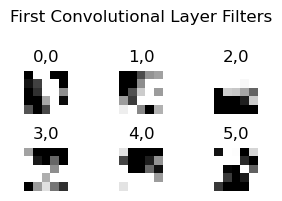

Layer shape: torch.Size([16, 6, 5, 5])


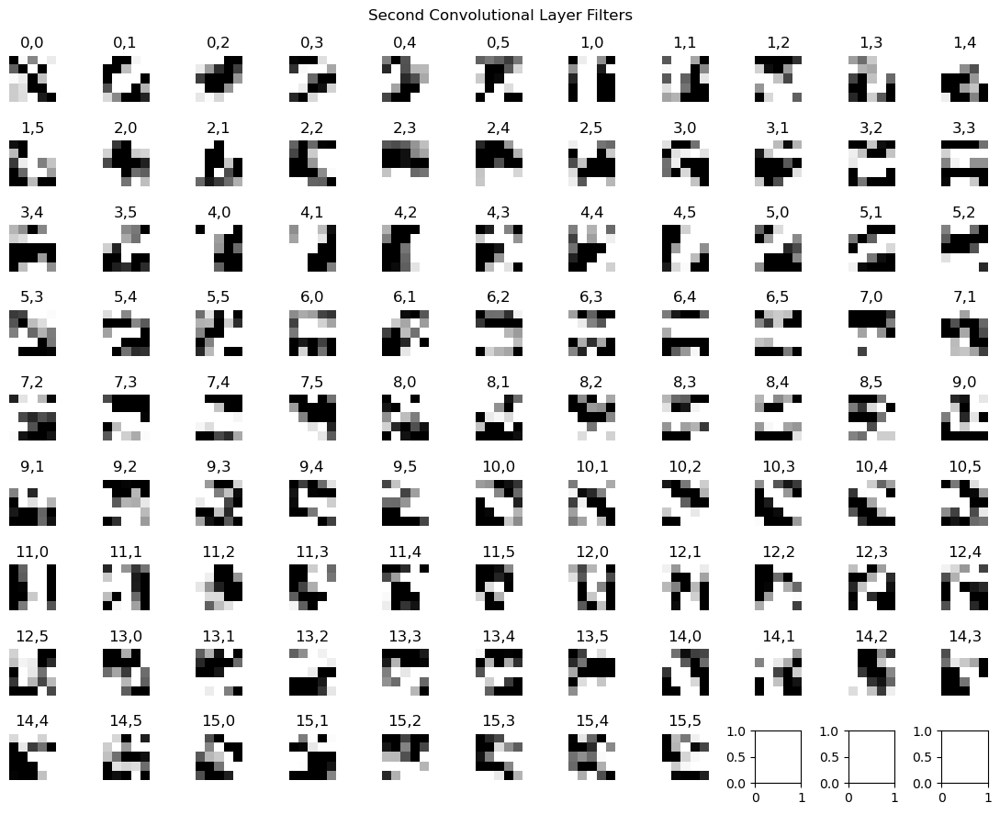

In [3]:
def visualize_filters(w, title=""):
    w = w.detach()
    #filters depth * number of filters
    print("Layer shape: {}".format(w.shape))
    nplots = w.shape[0]*w.shape[1]
    
    nrows = int(nplots**0.5)
    ncols = nplots/nrows
    while nrows*ncols < nplots:
        nrows+=1        
    ncols = int(np.ceil(ncols))
    npimg = np.array(w.numpy(), np.float32)
    
    count = 0
    # fig = plt.figure(figsize=(ncols, nrows))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols, nrows))
    #looping through all the filters in each channel

    for i in range(w.shape[0]):
        for j in range(w.shape[1]):
            ax1 = ax[count//ncols, count%ncols]
            npimg = np.array(w[i, j].numpy(), np.float32)
            npimg = (npimg - np.mean(npimg)) / np.std(npimg)
            npimg = np.minimum(1, np.maximum(0, (npimg + 0.5)))
            ax1.imshow(npimg, cmap="gray")
            ax1.set_title(str(i) + ',' + str(j))
            ax1.axis('off')
            ax1.set_xticklabels([])
            ax1.set_yticklabels([])
            count += 1

    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

def visualize_model(model, layer_idx, title=""):
    w = model.convnet[layer_idx].weight.data
    visualize_filters(w, title=title)

# Visualize the first two convolutional layer filters
visualize_model(net, 0, title="First Convolutional Layer Filters")
visualize_model(net, 3, title="Second Convolutional Layer Filters")

In [4]:
class FrankenLeNet(nn.Module):
    """Acts as a LeNet up to the specified convolutional layer
    """

    def __init__(self, layer_idx, net):
        super(FrankenLeNet, self).__init__()
        
        self.convnet = net.convnet[:layer_idx]

    def forward(self, img):
        return self.convnet(img)

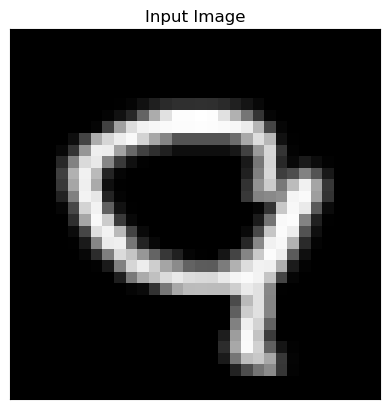

torch.Size([6, 28, 28])
Layer shape: torch.Size([1, 6, 28, 28])


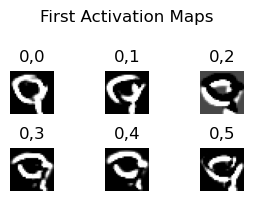

torch.Size([16, 10, 10])
Layer shape: torch.Size([1, 16, 10, 10])


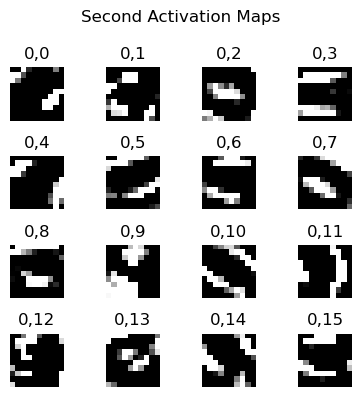

torch.Size([120, 1, 1])


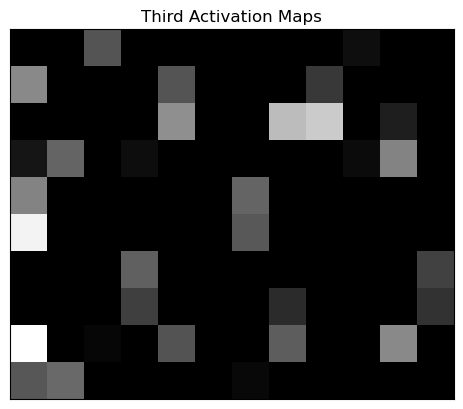

In [5]:
fnet = FrankenLeNet(2, net)
fnet2 = FrankenLeNet(5, net)
fnet3 = FrankenLeNet(8, net)
data_loader = torch.utils.data.DataLoader(data_test, 
                                          batch_size=1,
                                          shuffle=True)
batch = next(iter(data_loader))
img = batch[0][0]
plt.imshow(img.reshape((32, 32)).numpy(), cmap="gray")
plt.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
plt.title("Input Image")
plt.show()

res = fnet(img)
res2 = fnet2(img)
res3 = fnet3(img)

print(res.shape)
visualize_filters(res.unsqueeze(0), title="First Activation Maps")


print(res2.shape)
visualize_filters(res2.unsqueeze(0),title="Second Activation Maps")

print(res3.shape)
plt.imshow(res3.squeeze(0).detach().numpy().reshape((10, 12)), cmap="gray")
plt.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
plt.title("Third Activation Maps")
plt.show()

## Decision Trees

### Getting the Data

In [6]:
import csv
import os
from tqdm import tqdm

### Visualizing the Relationship Between Filters and Digits

In [7]:
def write_filter_activations(ind_csv, level_csv, layer, topk):    
    fnet = FrankenLeNet(layer, net)
    data_loader = data_loader = torch.utils.data.DataLoader(data_test, 
                                            batch_size=1,
                                            shuffle=False)

    if not os.path.isfile(ind_csv) and not os.path.isfile(level_csv):
        ind_file = open(ind_csv, 'a+', newline ='')
        level_file = open(level_csv, 'a+', newline ='')
        pbar = tqdm(len(data_loader), position=0, leave=False)

        with ind_file, level_file:
            ind_writer = csv.writer(ind_file)
            level_writer = csv.writer(level_file)
            for i, data in enumerate(data_loader):
                activations = fnet(data[0]).squeeze(0)
                summed_t = activations.sum(1).sum(1)
                max_vals_t, max_inds_t = torch.topk(summed_t, topk)
                max_vals, max_inds = max_vals_t.tolist(), max_inds_t.tolist()
                summed = summed_t.tolist()
                # TODO: Experiment with using activation values in the tree
                ind_writer.writerow([data[1].item()] + max_inds)
                level_writer.writerow([data[1].item()] + summed)
                pbar.set_description("Writing image {}".format(i))
                pbar.update(1)
        pbar.close()

# write_filter_activations('./tree_data/max_indices_conv2.csv', './tree_data/max_activations_conv2.csv', 5, 16)
write_filter_activations('./tree_data/conv3_activations.csv', './tree_data/activation_indices.csv', 8, 120)

### Visualizing how Activation Maps Divide the Data

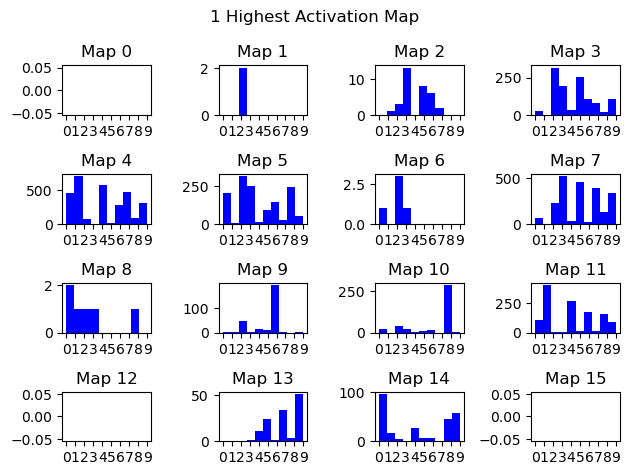

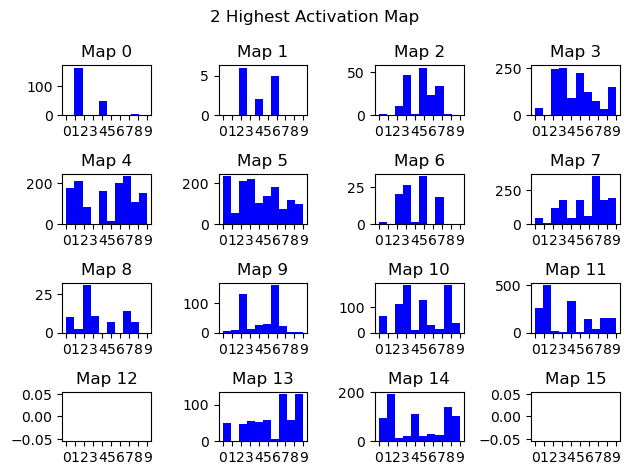

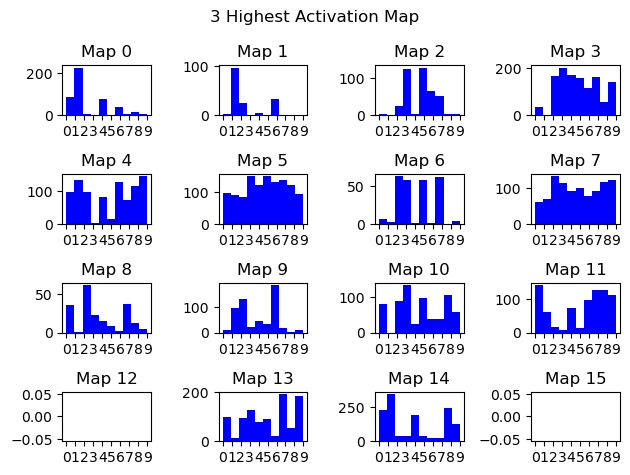

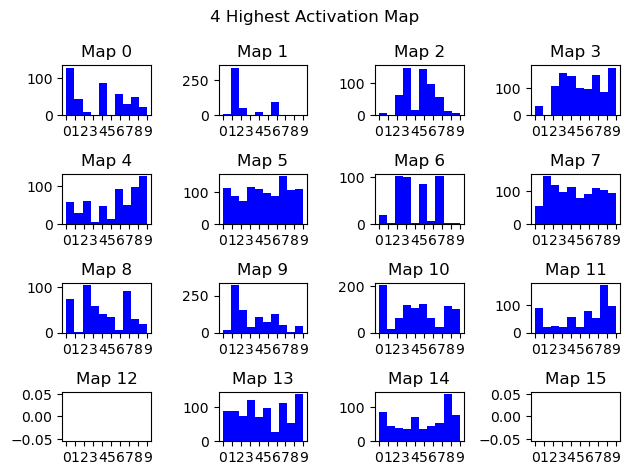

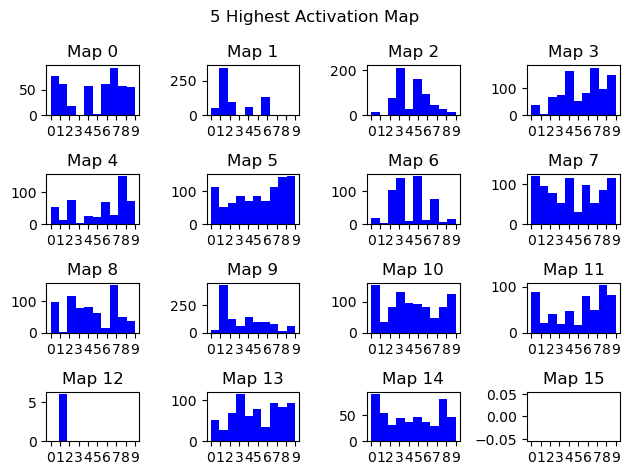

...

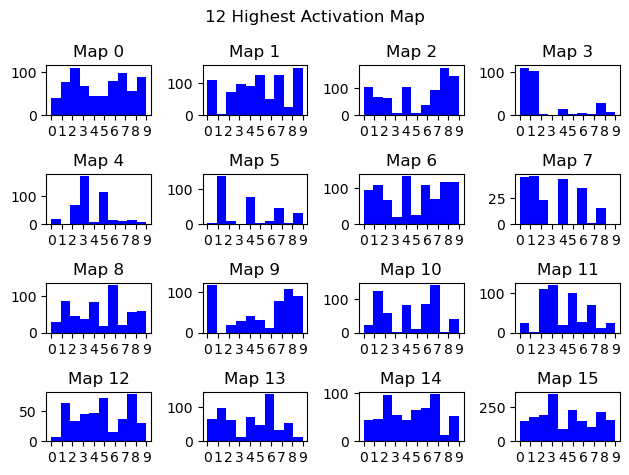

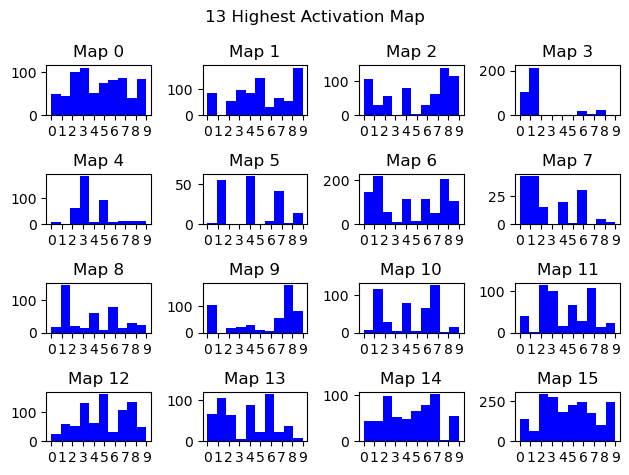

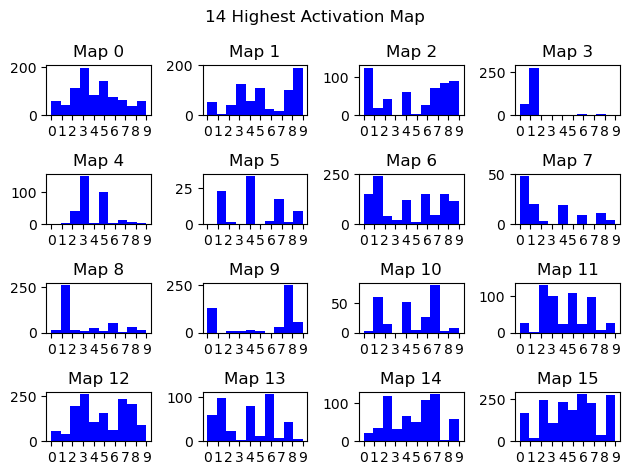

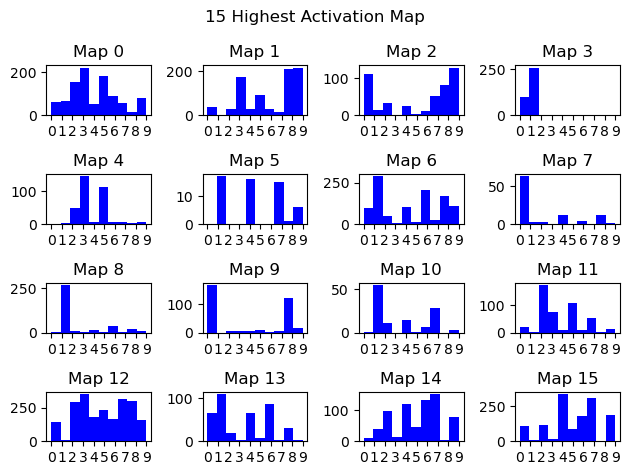

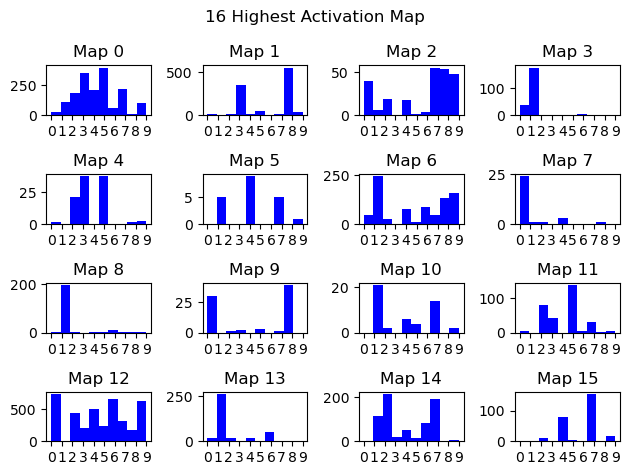

In [8]:
def plot_activations(csv_path, ind, plot_rows, plot_cols):   

    # ind is the column containing the ind highest filter index in questio i.e. 1 for first highest filter index
    arr = np.genfromtxt(csv_path, delimiter=',')
    filters = arr[:, ind]
    labels = arr[:, 0]
    fig, ax = plt.subplots(plot_rows, plot_cols)
    for i in range(plot_rows * plot_cols):
        ax[i//plot_cols, i%plot_rows].hist(labels[filters==i], bins=10, range=(0, 9), color='blue')
        ax[i//plot_cols, i%plot_rows].set_title("Map {}".format(i))
        ax[i//plot_cols, i%plot_rows].set_xticks(list(range(10)))
    fig.suptitle("{} Highest Activation Map".format(ind))
    plt.tight_layout()
    plt.show()

for i in range(1, 17):
    plot_activations('./tree_data/max_indices_conv2.csv', i, 4, 4)

### Fitting Trees and Finding Feature Importance

In [9]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from xgboost import plot_tree
from sklearn import metrics
from sklearn import tree
%matplotlib inline

def get_tree_training_data(csv_path, indxs):
    activation_data = np.loadtxt(csv_path, delimiter=',')
    X = activation_data[:, 1:][:, indxs]
    y = activation_data[:, 0]
    return train_test_split(X, y, test_size=0.2)

In [54]:

def fit_tree(csv_path, topk_filters, indxs, plot=False, plot_title="", depth=8, n_estimators=1):
    X_train, X_test, y_train, y_test = get_tree_training_data(csv_path, indxs)
    tree_model = XGBClassifier(max_depth=depth, learning_rate=0.1, n_estimators=n_estimators, objective='reg:logistic', booster='gbtree', importance_type='gain')
    XGB = tree_model.fit(X_train, y_train)
    prediction = XGB.predict(X_test)
    feature_importances = pd.Series(XGB.feature_importances_)

    if plot:
        print("Classification Report")
        print(metrics.classification_report(y_test, prediction))
        print("Confusion Matrix")
        print(metrics.confusion_matrix(y_test, prediction))
        feature_importances.nlargest(topk_filters).plot(kind='barh', title=plot_title, xlabel='Feature Importance', ylabel='Feature Index')

        plot_tree(XGB, num_trees=0)
        fig = plt.gcf()
        fig.set_size_inches(200, 100)
        fig.savefig(csv_path.split('.')[1].split('/')[-1] + '_tree.png')
        plt.show()
    
    feature_list = np.argsort(feature_importances.tolist())
    return metrics.accuracy_score(y_test, prediction), np.flip(feature_list)


In [55]:
def run_test(features, num_filters, csv_path, title):
    accs1 = []
    for i in range(num_filters):
        accs1.append(fit_tree(csv_path, num_filters, indxs = features[i:], plot=False)[0])

    accs = []
    flipped = np.flip(features)
    for i in range(num_filters):
        accs.append(fit_tree(csv_path, num_filters, indxs = flipped[i:], plot=False)[0])

    plt.plot(np.arange(0, num_filters), accs)
    plt.plot(np.arange(0,num_filters), accs1)
    
    plt.legend(["Removing least important filters", "Removing most important filters"])
    plt.title(title)
    plt.xlabel("Number of filters removed")
    plt.ylabel("Accuracy")
    plt.show()

### Fitting Tree to First Layer Activations

Classification Report
              precision    recall  f1-score   support

         0.0       0.53      0.44      0.48       189
         1.0       0.90      0.94      0.92       245
         2.0       0.41      0.37      0.39       200
         3.0       0.34      0.44      0.39       205
         4.0       0.30      0.30      0.30       202
         5.0       0.42      0.39      0.41       188
         6.0       0.45      0.34      0.39       200
         7.0       0.40      0.38      0.39       213
         8.0       0.27      0.33      0.29       178
         9.0       0.26      0.29      0.28       180

    accuracy                           0.44      2000
   macro avg       0.43      0.42      0.42      2000
weighted avg       0.44      0.44      0.44      2000

Confusion Matrix
[[ 84   1  13   9  25   5  11   4  27  10]
 [  1 231   1   2   4   0   0   3   0   3]
 [ 12   0  74  54   1  31   5  11  11   1]
 [  4   0  26  91   1  54   1  11  16   1]
 [  6   6   3   3  60   0  25 

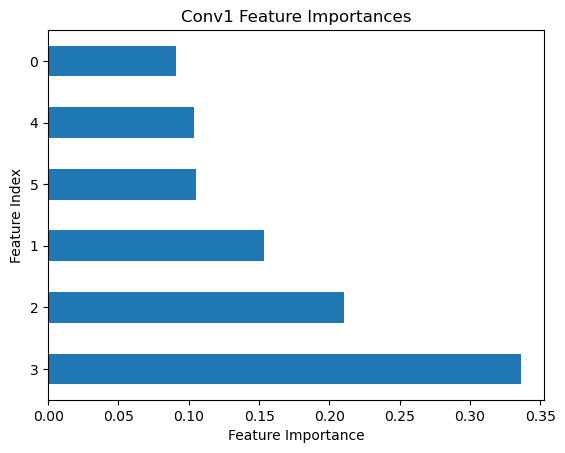

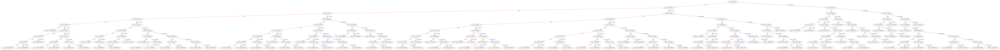

Accuracy:  0.4365
Forest Accuracy:  0.547


In [56]:
acc, features = fit_tree('./tree_data/max_activations_conv1.csv',
                         6, 
                         indxs = [i for i in range(6)], 
                         plot=True,
                         plot_title="Conv1 Feature Importances",
                         depth=8,
                         n_estimators=1)

forest_acc, _ = fit_tree('./tree_data/max_activations_conv1.csv',
                         6, 
                         indxs = [i for i in range(6)], 
                         plot=False,
                         depth=8,
                         n_estimators=500)

print("Accuracy: ", acc)
print("Forest Accuracy: ", forest_acc)

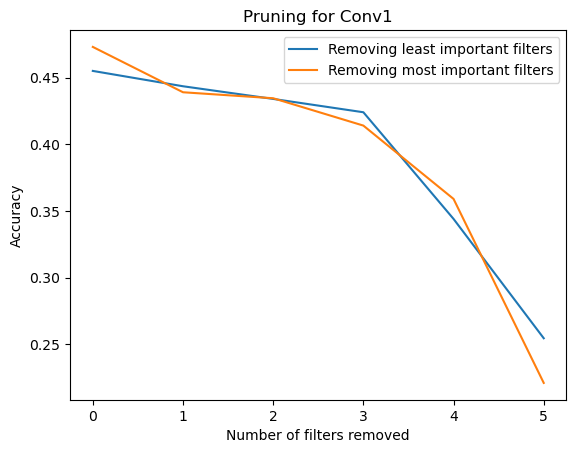

In [57]:
run_test(features, 6, './tree_data/max_activations_conv1.csv', 'Pruning for Conv1')

### Fitting Tree to Second Layer Activations

Classification Report
              precision    recall  f1-score   support

         0.0       0.82      0.79      0.81       189
         1.0       0.96      0.97      0.97       237
         2.0       0.66      0.76      0.71       192
         3.0       0.82      0.76      0.79       215
         4.0       0.72      0.73      0.72       200
         5.0       0.64      0.62      0.63       198
         6.0       0.76      0.72      0.74       181
         7.0       0.79      0.83      0.81       182
         8.0       0.87      0.85      0.86       213
         9.0       0.70      0.69      0.70       193

    accuracy                           0.78      2000
   macro avg       0.77      0.77      0.77      2000
weighted avg       0.78      0.78      0.78      2000

Confusion Matrix
[[150   7  12   1   4   5   5   1   4   0]
 [  0 231   2   1   0   0   1   1   0   1]
 [  4   0 146   4   4  10   6   3   5  10]
 [  0   0   7 163   2  28   2   3   5   5]
 [  5   0   3   1 146   4  19 

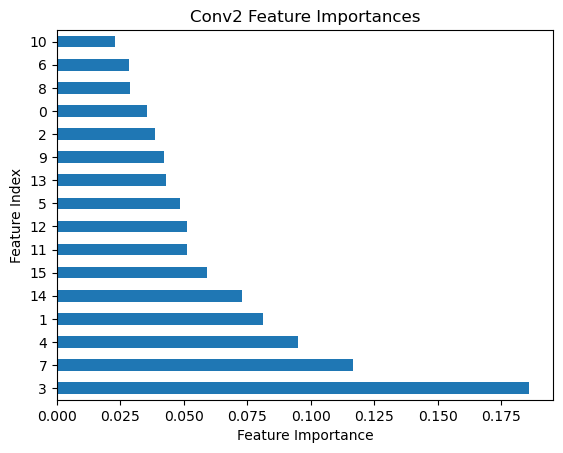

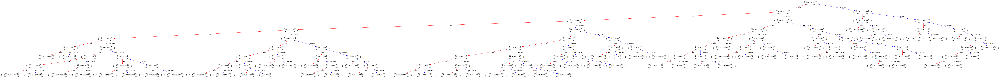

Accuracy:  0.7775
Forest Accuracy:  0.908


In [66]:
acc, features = fit_tree('./tree_data/max_activations_conv2.csv',
                         16, 
                         indxs = [i for i in range(16)], 
                         depth=8,
                         n_estimators=1,
                         plot=True,
                         plot_title="Conv2 Feature Importances")

forest_acc, _ = fit_tree('./tree_data/max_activations_conv2.csv',
                            16, 
                            indxs = [i for i in range(16)], 
                            plot=False,
                            depth=8,
                            n_estimators=500)

print("Accuracy: ", acc)
print("Forest Accuracy: ", forest_acc)

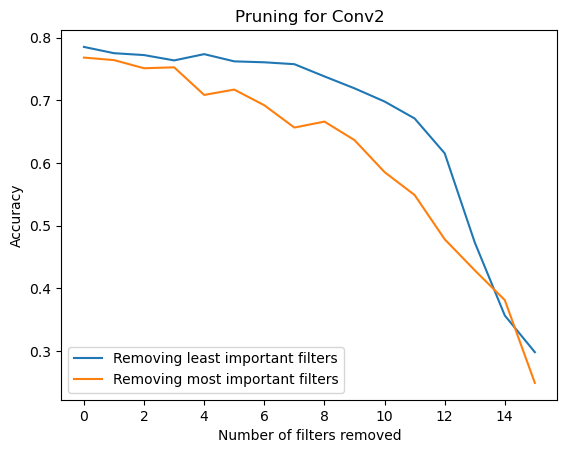

In [67]:
run_test(features, 16, './tree_data/max_activations_conv2.csv', 'Pruning for Conv2')

### Fitting a Tree to Third Convolutional Layer Activations

Classification Report
              precision    recall  f1-score   support

         0.0       0.71      0.79      0.75       196
         1.0       0.94      0.91      0.93       220
         2.0       0.85      0.77      0.81       218
         3.0       0.78      0.81      0.79       184
         4.0       0.76      0.73      0.75       194
         5.0       0.70      0.73      0.72       169
         6.0       0.74      0.64      0.68       206
         7.0       0.69      0.79      0.74       209
         8.0       0.82      0.82      0.82       199
         9.0       0.67      0.67      0.67       205

    accuracy                           0.77      2000
   macro avg       0.77      0.77      0.77      2000
weighted avg       0.77      0.77      0.77      2000

Confusion Matrix
[[154   2   2   1   3   5   7  11   1  10]
 [  1 201   0   2   3   2   1   3   5   2]
 [  3   0 167  10   3   4   6  16   6   3]
 [  0   0   6 149   0  16   2   7   2   2]
 [  9   3   1   3 142   2   9 

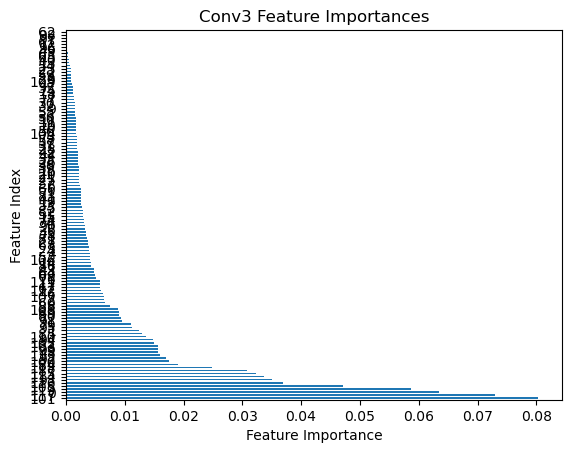

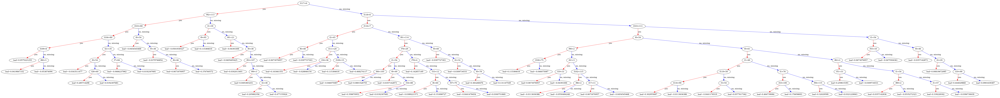

Accuracy:  0.7675
Forest Accuracy:  0.94


In [60]:
inds = [i for i in range(120)]
acc, features = fit_tree('./tree_data/conv3_activations.csv', 120, inds, plot=True, plot_title="Conv3 Feature Importances", depth=8, n_estimators=1)

forest_acc, _  = fit_tree('./tree_data/conv3_activations.csv', 120, inds, plot=False, depth=8, n_estimators=500)

print("Accuracy: ", acc)
print("Forest Accuracy: ", forest_acc)


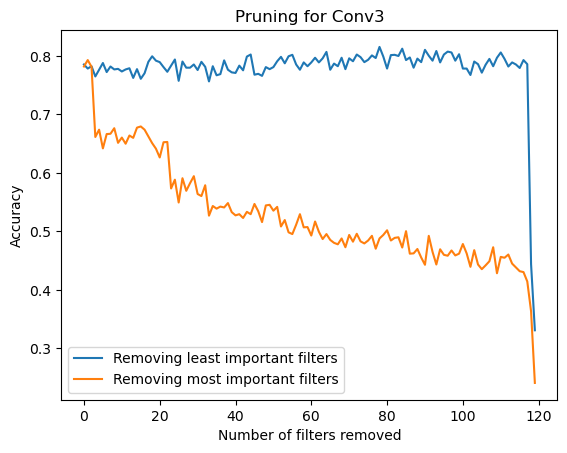

In [61]:
run_test(features, 120, './tree_data/conv3_activations.csv', 'Pruning for Conv3')

### Other Experiments

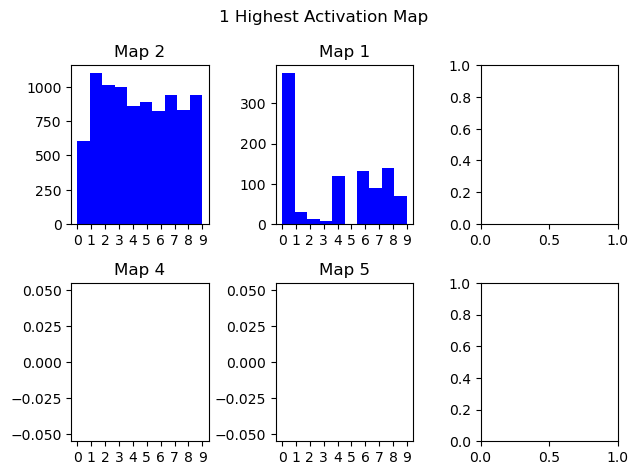

In [62]:
write_filter_activations('./tree_data/max_indices_conv1.csv', './tree_data/max_activations_conv1.csv', 2, 6)
plot_activations('./tree_data/max_indices_conv1.csv', 1, 2, 3)

In [63]:
write_filter_activations('./tree_data/conv2_top6_inds.csv', './tree_data/conv2_top6_acts.csv', 5, 6)

In [64]:
fit_tree('./tree_data/conv2_top6_acts.csv', 6)

TypeError: fit_tree() missing 1 required positional argument: 'indxs'

Classification Report
              precision    recall  f1-score   support

         0.0       0.56      0.60      0.58       198
         1.0       0.91      0.91      0.91       210
         2.0       0.49      0.49      0.49       202
         3.0       0.60      0.70      0.65       213
         4.0       0.61      0.58      0.59       186
         5.0       0.43      0.35      0.39       205
         6.0       0.55      0.55      0.55       181
         7.0       0.62      0.68      0.65       211
         8.0       0.72      0.78      0.75       197
         9.0       0.55      0.46      0.50       197

    accuracy                           0.61      2000
   macro avg       0.60      0.61      0.61      2000
weighted avg       0.61      0.61      0.61      2000

Confusion Matrix
[[118   5   9   3   7   4  13   4  11  24]
 [  2 191   0   0   8   1   3   0   2   3]
 [ 10   0  98   9   6  27  26  16   4   6]
 [  2   0   7 149   2  33   1   3  11   5]
 [ 23   7   6   2 107   4  11 

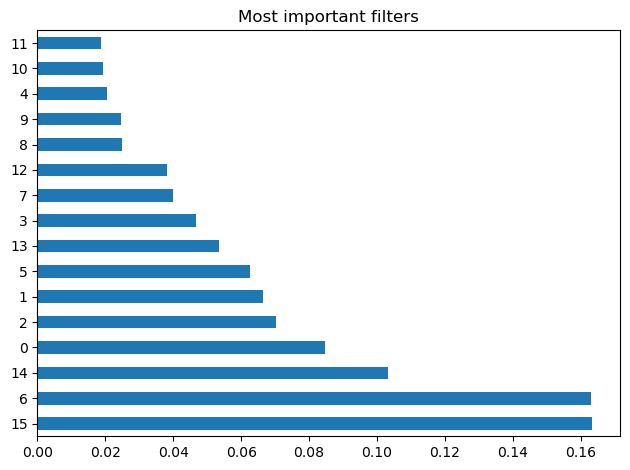

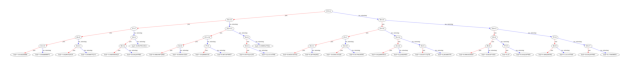

In [ ]:
fit_tree('./tree_data/max_indices_conv2.csv', 16)

Classification Report
              precision    recall  f1-score   support

         0.0       0.53      0.53      0.53       179
         1.0       0.98      0.96      0.97       201
         2.0       0.42      0.49      0.46       197
         3.0       0.39      0.40      0.40       208
         4.0       0.46      0.52      0.49       197
         5.0       0.49      0.54      0.52       180
         6.0       0.66      0.50      0.57       227
         7.0       0.58      0.55      0.57       220
         8.0       0.48      0.49      0.49       188
         9.0       0.42      0.38      0.40       203

    accuracy                           0.54      2000
   macro avg       0.54      0.54      0.54      2000
weighted avg       0.55      0.54      0.54      2000

Confusion Matrix
[[ 95   0  23   8  16   4  11   1  17   4]
 [  0 193   0   0   6   1   0   1   0   0]
 [ 12   0  97  39   4  22   8   3  12   0]
 [  2   0  39  84   0  63   1  11   7   1]
 [ 15   0   1   0 102   0  22 

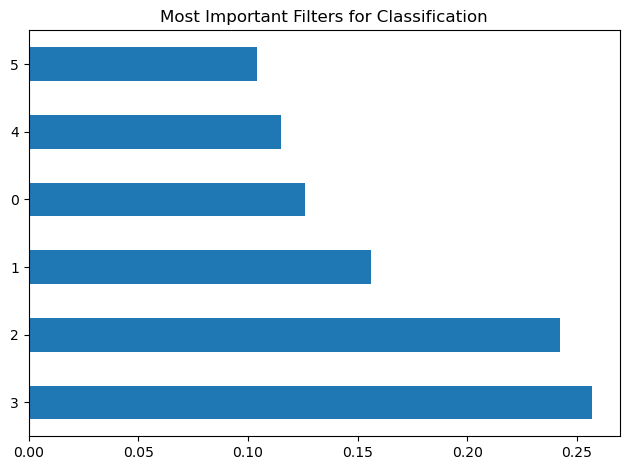

In [ ]:
fit_tree('./tree_data/max_activations_conv1.csv', 6)

Classification Report
              precision    recall  f1-score   support

         0.0       0.89      0.84      0.86       194
         1.0       0.97      0.98      0.97       235
         2.0       0.69      0.77      0.73       220
         3.0       0.77      0.74      0.76       207
         4.0       0.71      0.77      0.73       179
         5.0       0.64      0.63      0.63       182
         6.0       0.77      0.73      0.75       190
         7.0       0.90      0.81      0.85       204
         8.0       0.86      0.85      0.86       204
         9.0       0.73      0.78      0.75       185

    accuracy                           0.79      2000
   macro avg       0.79      0.79      0.79      2000
weighted avg       0.80      0.79      0.80      2000

Confusion Matrix
[[162   3  16   0   1   1   8   0   3   0]
 [  0 230   1   0   1   0   1   0   2   0]
 [  4   0 170   3   4  10  13   4   6   6]
 [  1   0   6 154   1  34   0   1   5   5]
 [  2   0   1   1 137   3  11 

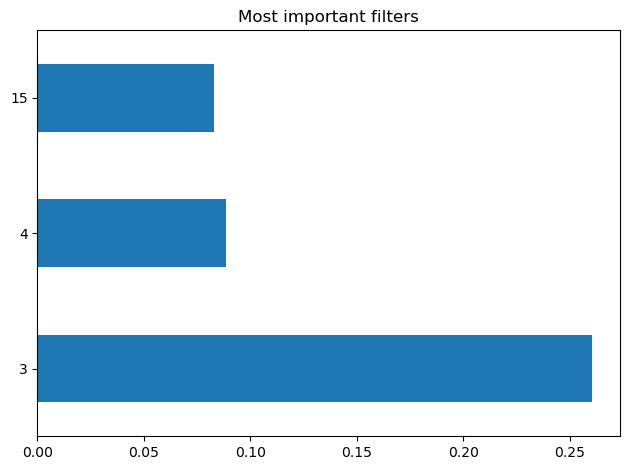

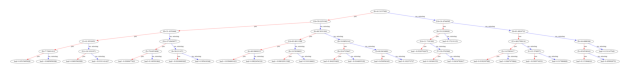

In [ ]:
write_filter_activations('./tree_data/conv2_top6_inds.csv', './tree_data/conv2_top6_acts.csv', 5, 3)
fit_tree('./tree_data/conv2_top6_acts.csv', 3)